<a href="https://colab.research.google.com/github/diegojeda/Bit-Optimization-ML/blob/master/Pruebas%20de%20Modelos.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [62]:
import pandas as pd
import numpy as np
from numpy import loadtxt
from pylab import *
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
from IPython.core.interactiveshell import InteractiveShell  
InteractiveShell.ast_node_interactivity = "all"
from IPython.display import display, HTML
import pandas as pd
from scipy import stats
import pandas_profiling
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import os
import missingno as msno
from pycaret.regression import *
from sklearn.model_selection import train_test_split
import math
from pandas_profiling import ProfileReport
import dtale
from itertools import product
import plotly.graph_objects as go
plt.style.use('ggplot');

In [63]:
url = "https://raw.githubusercontent.com/diegojeda/Curso-Analytics---Drilling-Bits/master/BLCat.csv"

base = pd.read_csv(url,error_bad_lines=False)

In [64]:
base

,Unnamed: 0,Well,Size,Bit_Number,Re_Run,Reference,Type,Structure,Formation,Footage,...,Min WOB,Max WOB,ROP,Mud Weight,Drive_System,Min_RPM,Max_RPM,Torque Max,Torque Min,Manufacturer
0,0,Florida 7,36.0,1,N,L3A,Tricone,Anticlinal N,C5,82.0,...,5.000000,13.0,10.10,8.5,Rotary,60.0,80.0,5.0,3.0,Varel
1,1,Florida 7,26.0,2,N,T43,Tricone,Anticlinal N,C5,15.0,...,18.000000,23.0,8.30,8.5,Rotary,48.0,48.0,15.0,2.0,Hycalog
2,2,Florida 7,26.0,2,R,T43,Tricone,Anticlinal N,C5,709.0,...,25.000000,78.0,11.29,8.5,RSS,47.0,73.0,15.0,2.0,Hycalog
3,3,Florida 7,26.0,2,R,T43,Tricone,Anticlinal N,C6,547.0,...,25.000000,78.0,11.29,8.5,RSS,47.0,73.0,15.0,2.0,Hycalog
4,4,Florida 7,26.0,3,N,GTX-CM03,Tricone,Anticlinal N,C6,438.0,...,40.000000,55.0,14.32,9.6,RSS,144.0,168.0,15.0,2.0,Hughes
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
207,207,Florida 9,8.5,19,N,FX74D,PDC,Anticlinal F,Guadalupe,219.0,...,15.000000,30.0,6.10,8.2,Rotary,90.0,120.0,8.0,6.0,Halliburton
208,208,Florida 9,8.5,20,N,Q408FX,PDC,Anticlinal F,Guadalupe,97.0,...,9.500000,45.0,2.50,8.2,Rotary,78.0,115.0,9.0,7.0,Hughes
209,209,Florida 9,8.5,21,N,MDSi813,PDC,Anticlinal F,Guadalupe,198.0,...,5.000000,35.0,4.00,8.3,Rotary,90.0,130.0,9.0,7.0,Smith
210,210,Florida 9,8.5,22,N,MDSi813,PDC,Anticlinal F,Guadalupe,56.0,...,9.500000,30.0,5.00,8.4,Rotary,50.0,135.0,8.5,7.0,Smith


Procederemos a trabajar con las medias de los rangos de los parametros, con el fin de reducir dimensiones y simplificar el modelo.

In [65]:
base.columns

Index(['Unnamed: 0', 'Well', 'Size', 'Bit_Number', 'Re_Run', 'Reference',
       'Type', 'Structure', 'Formation', 'Footage', 'Depth in', 'Depth out',
       'Depth Average', 'Blades', 'Cutter size', 'Min Flow Rate',
       'Max Flow Rate', 'TFA', 'HSI', 'Min WOB', 'Max WOB', 'ROP',
       'Mud Weight', 'Drive_System', 'Min_RPM', 'Max_RPM', 'Torque Max',
       'Torque Min', 'Manufacturer'],
      dtype='object')

In [66]:
base["Flow Rate"] = base[["Min Flow Rate","Max Flow Rate"]].mean(axis=1)
base["RPM"] = base[["Min_RPM","Max_RPM"]].mean(axis=1)
base["Torque"] = base[["Torque Min","Torque Max"]].mean(axis=1)
base["WOB"] = base[["Min WOB","Max WOB"]].mean(axis=1)

In [67]:
base=base.drop(["Unnamed: 0","Min Flow Rate","Max Flow Rate","Min_RPM","Max_RPM","Torque Min","Torque Max","Min WOB","Max WOB"],axis=1)

In [68]:
base.columns

Index(['Well', 'Size', 'Bit_Number', 'Re_Run', 'Reference', 'Type',
       'Structure', 'Formation', 'Footage', 'Depth in', 'Depth out',
       'Depth Average', 'Blades', 'Cutter size', 'TFA', 'HSI', 'ROP',
       'Mud Weight', 'Drive_System', 'Manufacturer', 'Flow Rate', 'RPM',
       'Torque', 'WOB'],
      dtype='object')

In [69]:
base.Manufacturer.unique()

array(['Varel', 'Hycalog', 'Hughes', 'Security', 'Smith', 'Halliburton'],
      dtype=object)

In [70]:
base.loc[base["Manufacturer"]=="Halliburton","Manufacturer"]="Man 1"
base.loc[base["Manufacturer"]=="Hughes","Manufacturer"]="Man 2"
base.loc[base["Manufacturer"]=="Hycalog","Manufacturer"]="Man 3"
base.loc[base["Manufacturer"]=="Security","Manufacturer"]="Man 4"
base.loc[base["Manufacturer"]=="Smith","Manufacturer"]="Man 5"
base.loc[base["Manufacturer"]=="Varel","Manufacturer"]="Man 6"

In [71]:
base.Manufacturer.unique()

array(['Man 6', 'Man 3', 'Man 2', 'Man 4', 'Man 5', 'Man 1'], dtype=object)

In [72]:
profile = ProfileReport(base, title="Pandas Profiling Report")

In [73]:
profile = ProfileReport(base, title='Pandas Profiling Report', explorative=True)

In [74]:
profile

In [75]:
d = dtale.show(base)
dtale.show(base, ignore_duplicate=True)

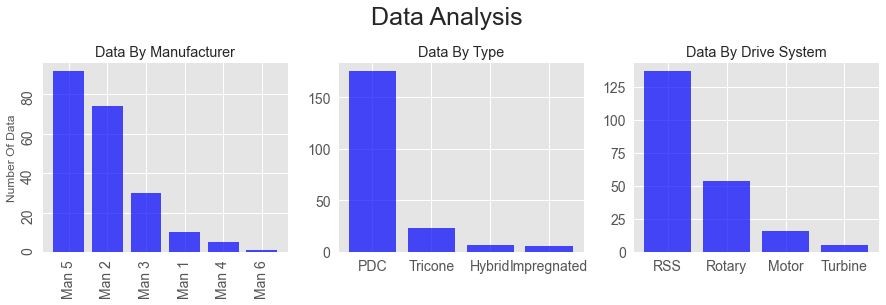

In [76]:
# Se crean las tablas, sumando los valores que se tienen para cada categoria
man = pd.DataFrame(base["Manufacturer"].value_counts())
typ = pd.DataFrame(base["Type"].value_counts())
drive = pd.DataFrame(base["Drive_System"].value_counts())

# Grafica Registro Wireline
fig = plt.figure(figsize=(15, 3.5))
fig.subplots_adjust(wspace=0.2)
fig.suptitle("Data Analysis",fontsize=25,y=1.1)

# Creamos los plots
ax1 = fig.add_subplot(131)
ax2 = fig.add_subplot(132)
ax3 = fig.add_subplot(133)

# Graficamos cada track de datos
ax1.bar(man.index,man.Manufacturer, alpha=0.7,color="blue")
ax2.bar(typ.index,typ.Type,alpha=0.7,color="blue")
ax3.bar(drive.index,drive.Drive_System, alpha=0.7,color="blue")

# Colocamos los titulos
ax1.set_title('Data By Manufacturer')
ax2.set_title('Data By Type')
ax3.set_title('Data By Drive System')
ax1.set_ylabel('Number Of Data')

ax1.tick_params(labelrotation=90,labelsize=14)
ax2.tick_params(labelsize=14)
ax3.tick_params(labelsize=14);

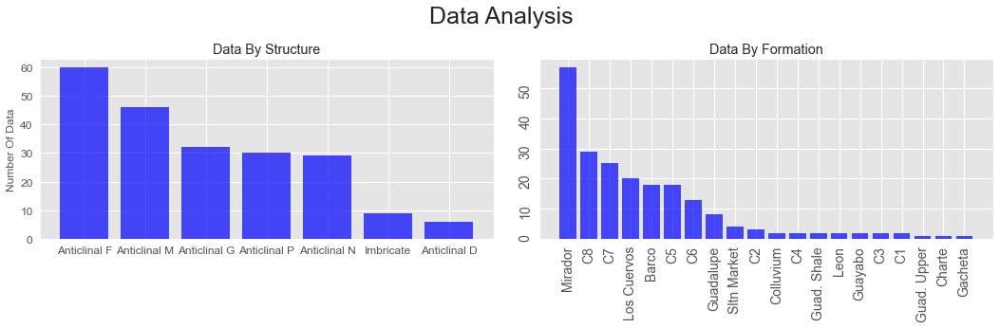

In [77]:
# Se crean las tablas, sumando los valores que se tienen para cada categoria
stru = pd.DataFrame(base["Structure"].value_counts())
form = pd.DataFrame(base["Formation"].value_counts())

# Grafica Registro Wireline
fig = plt.figure(figsize=(18, 3.5))
fig.subplots_adjust(wspace=0.1)
fig.suptitle("Data Analysis",fontsize=25,y=1.1)

# Creamos los plots
ax1 = fig.add_subplot(121)
ax2 = fig.add_subplot(122)

# Graficamos cada track de datos
ax1.bar(stru.index,stru.Structure, alpha=0.7,color="blue")
ax2.bar(form.index,form.Formation,alpha=0.7,color="blue")

# Colocamos los titulos
ax1.set_title('Data By Structure')
ax2.set_title('Data By Formation')
ax1.set_ylabel('Number Of Data')

ax1.tick_params(labelsize=12)
ax2.tick_params(labelrotation=90,labelsize=14);

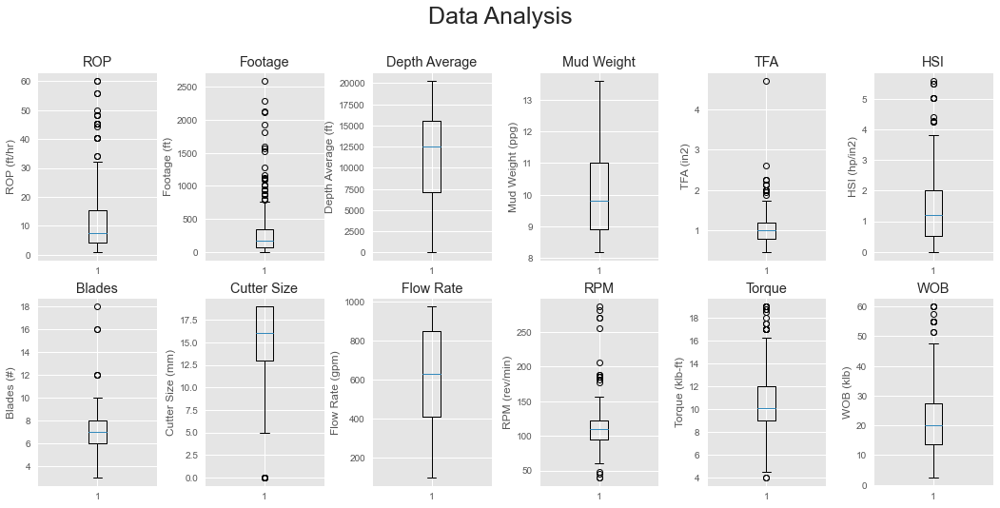

In [78]:
# Grafica
fig = plt.figure(figsize=(18,8))
fig.subplots_adjust(wspace=0.4)
fig.suptitle("Data Analysis",fontsize=25,y=1.0)

# Creamos los plots
ax1 = fig.add_subplot(261)
ax2 = fig.add_subplot(262)
ax3 = fig.add_subplot(263)
ax4 = fig.add_subplot(264)
ax5 = fig.add_subplot(265)
ax6 = fig.add_subplot(266)
ax7 = fig.add_subplot(267)
ax8 = fig.add_subplot(268)
ax9 = fig.add_subplot(269)
ax10 = fig.add_subplot(2,6,10)
ax11 = fig.add_subplot(2,6,11)
ax12 = fig.add_subplot(2,6,12)

# Graficamos cada track de datos
ax1.boxplot(base.ROP)
ax2.boxplot(base.Footage)
ax3.boxplot(base["Depth Average"])
ax4.boxplot(base["Mud Weight"])
ax5.boxplot(base.TFA)
ax6.boxplot(base.HSI)

ax7.boxplot(base.Blades)
ax8.boxplot(base["Cutter size"])
ax9.boxplot(base["Flow Rate"])
ax10.boxplot(base["RPM"])
ax11.boxplot(base["Torque"])
ax12.boxplot(base["WOB"])

# Colocamos los titulos
ax1.set_title('ROP')
ax1.set_ylabel('ROP (ft/hr)')
ax2.set_title('Footage')
ax2.set_ylabel('Footage (ft)')
ax3.set_title('Depth Average')
ax3.set_ylabel('Depth Average (ft)')
ax4.set_title('Mud Weight')
ax4.set_ylabel('Mud Weight (ppg)')
ax5.set_title('TFA')
ax5.set_ylabel('TFA (in2)')
ax6.set_title('HSI')
ax6.set_ylabel('HSI (hp/in2)')
ax7.set_title('Blades')
ax7.set_ylabel('Blades (#)')
ax8.set_title('Cutter Size')
ax8.set_ylabel('Cutter Size (mm)')
ax9.set_title('Flow Rate')
ax9.set_ylabel('Flow Rate (gpm)')
ax10.set_title('RPM')
ax10.set_ylabel('RPM (rev/min)')
ax11.set_title('Torque')
ax11.set_ylabel('Torque (klb-ft)')
ax12.set_title('WOB')
ax12.set_ylabel('WOB (klb)');

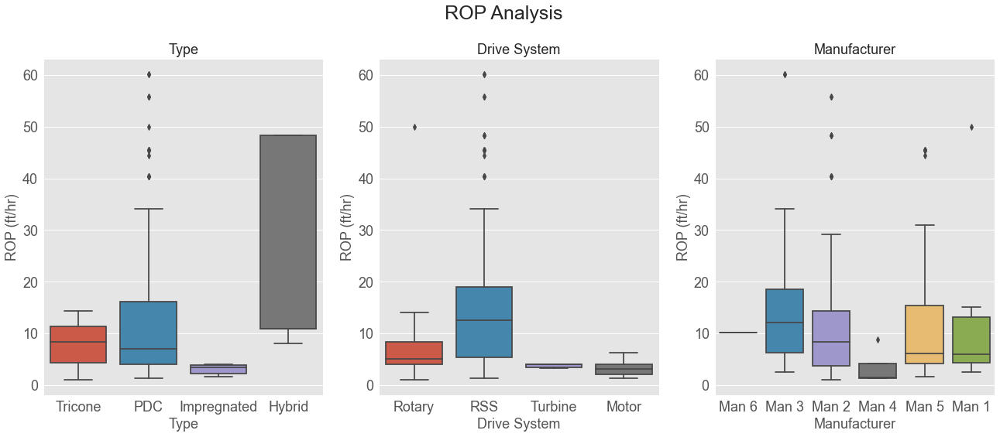

In [79]:
# Creamos la figura y los ejes
fig, axes = plt.subplots(1, 3, figsize=(22, 8), sharey=False)
fig.suptitle('ROP Analysis', fontsize=25,y=1)

sns.boxplot(ax=axes[0], y=base.ROP, x=base.Type)
axes[0].set_title("Type",fontsize=18)
axes[0].tick_params(labelsize=18)
axes[0].set_ylabel('ROP (ft/hr)',fontsize=18)
axes[0].set_xlabel('Type',fontsize=18)


sns.boxplot(ax=axes[1], y=base.ROP, x=base.Drive_System)
axes[1].set_title("Drive System",fontsize=18)
axes[1].tick_params(labelsize=18)
axes[1].set_ylabel('ROP (ft/hr)',fontsize=18)
axes[1].set_xlabel('Drive System',fontsize=18)

sns.boxplot(ax=axes[2], y=base.ROP, x=base.Manufacturer)
axes[2].set_title("Manufacturer",fontsize=18)
axes[2].tick_params(labelsize=18)
axes[2].set_ylabel('ROP (ft/hr)',fontsize=18)
axes[2].set_xlabel('Manufacturer',fontsize=18);

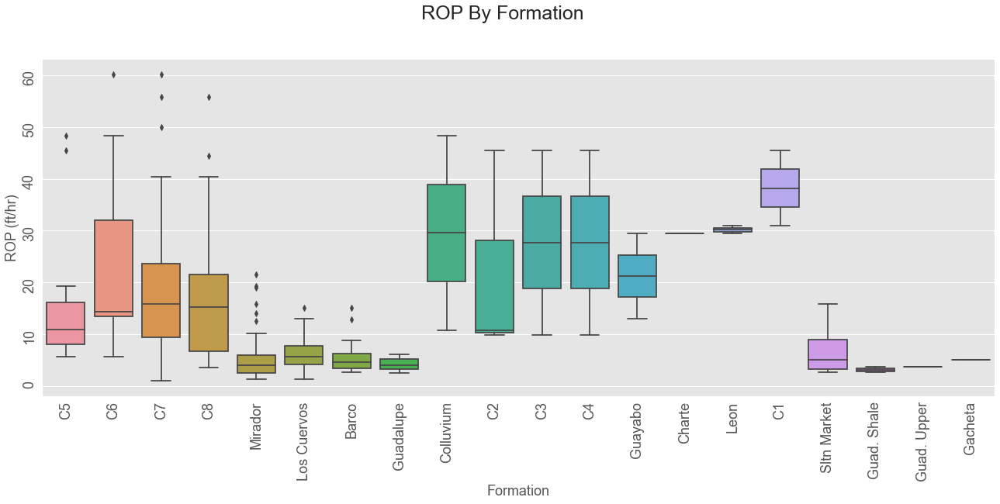

In [80]:
# Grafica
fig = plt.figure(figsize=(22, 8))
fig.subplots_adjust(wspace=0.3)
fig.suptitle("ROP By Formation",fontsize=25,y=1)
bplot=sns.boxplot(y='ROP', x='Formation',data=base)

# Colocamos los titulos
bplot.set_ylabel('ROP (ft/hr)',fontsize=18)
bplot.set_xlabel('Formation',fontsize=18)

bplot.tick_params(labelrotation=90,labelsize=18);

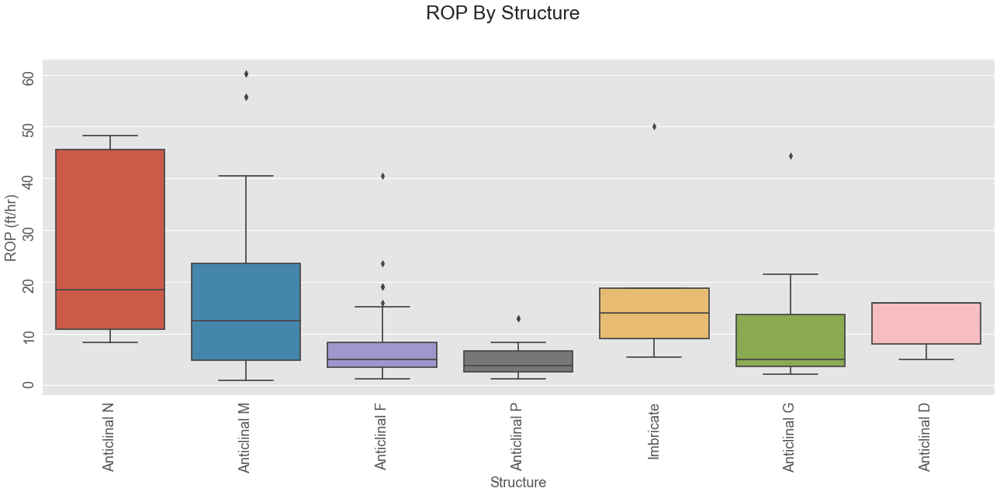

In [81]:
# Grafica
fig = plt.figure(figsize=(22, 8))
fig.subplots_adjust(wspace=0.3)
fig.suptitle("ROP By Structure",fontsize=25,y=1)
bplot=sns.boxplot(y='ROP', x='Structure',data=base)

# Colocamos los titulos
bplot.set_ylabel('ROP (ft/hr)',fontsize=18)
bplot.set_xlabel('Structure',fontsize=18)

bplot.tick_params(labelrotation=90,labelsize=18);

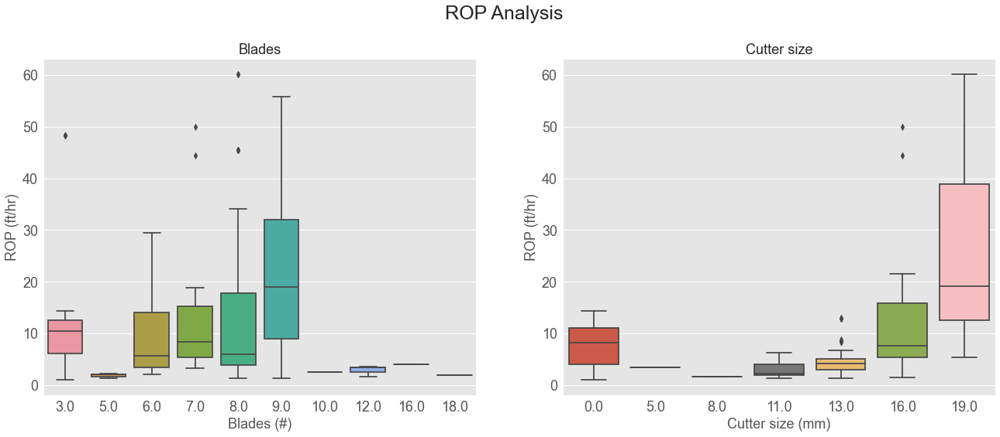

In [82]:
# Creamos la figura y los ejes
fig, axes = plt.subplots(1, 2, figsize=(22, 8), sharey=False)
fig.suptitle('ROP Analysis', fontsize=25,y=1)

sns.boxplot(ax=axes[0], y=base.ROP, x=base.Blades)
axes[0].set_title("Blades",fontsize=18)
axes[0].set_ylabel('ROP (ft/hr)',fontsize=18)
axes[0].set_xlabel('Blades (#)',fontsize=18)
axes[0].tick_params(labelsize=18)

sns.boxplot(ax=axes[1], y=base.ROP, x=base["Cutter size"])
axes[1].set_title("Cutter size",fontsize=18)
axes[1].set_xlabel('Cutter size (mm)',fontsize=18)
axes[1].set_ylabel('ROP (ft/hr)',fontsize=18)
axes[1].tick_params(labelsize=18);

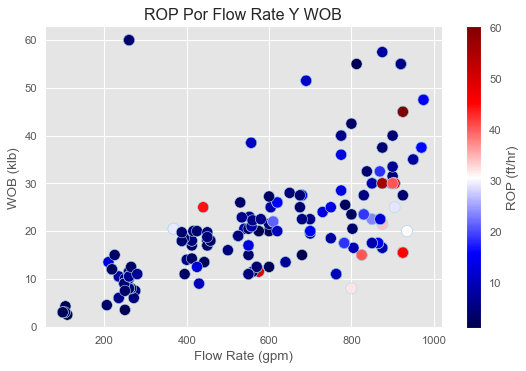

In [83]:
plt.figure(figsize=(8, 5), dpi=80)
plt.scatter(base["Flow Rate"],base["WOB"],s=100,c=base["ROP"],cmap='seismic',edgecolors='lightblue')
plt.title('ROP Por Flow Rate Y WOB')
plt.xlabel("Flow Rate (gpm)")
plt.ylabel("WOB (klb)")
clb = plt.colorbar()
clb.set_label("ROP (ft/hr)");

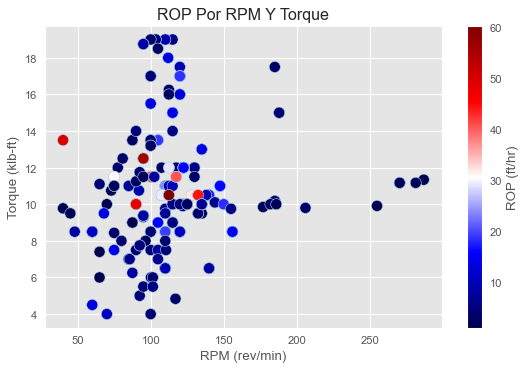

In [84]:
plt.figure(figsize=(8, 5), dpi=80)
plt.scatter(base["RPM"],base["Torque"],s=100,c=base["ROP"],cmap='seismic',edgecolors='lightblue')
plt.title('ROP Por RPM Y Torque')
plt.xlabel("RPM (rev/min)")
plt.ylabel("Torque (klb-ft)")
clb = plt.colorbar()
clb.set_label("ROP (ft/hr)");

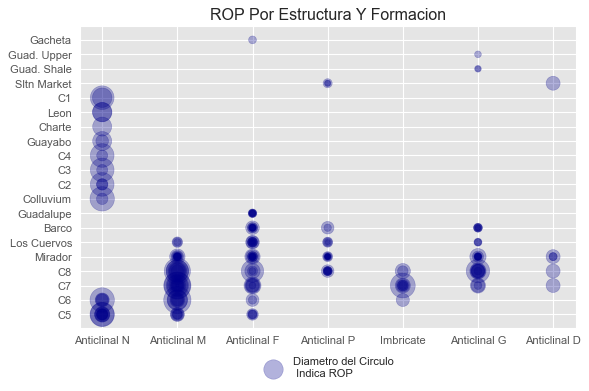

In [85]:
plt.figure(figsize=(8, 5), dpi=80)
plt.scatter(base.Structure,base.Formation,s=10*base["ROP"],c="darkblue",alpha=0.3,label="Diametro del Circulo\n Indica ROP")
plt.title('ROP Por Estructura Y Formacion')
plt.legend(loc='lower center', bbox_to_anchor=(0.5, -0.2));

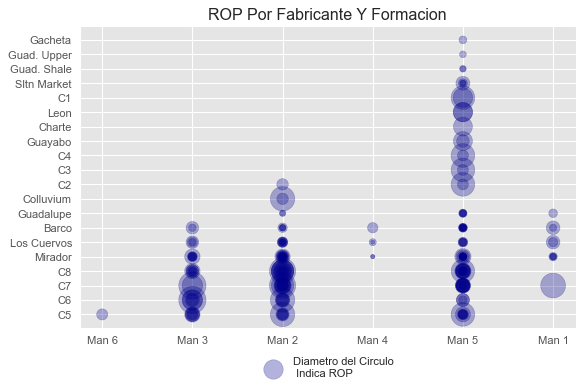

In [86]:
plt.figure(figsize=(8, 5), dpi=80)
plt.scatter(base.Manufacturer,base.Formation,s=10*base["ROP"],c="darkblue",alpha=0.3,label="Diametro del Circulo\n Indica ROP")
plt.title('ROP Por Fabricante Y Formacion')
plt.legend(loc='lower center', bbox_to_anchor=(0.5, -0.2));

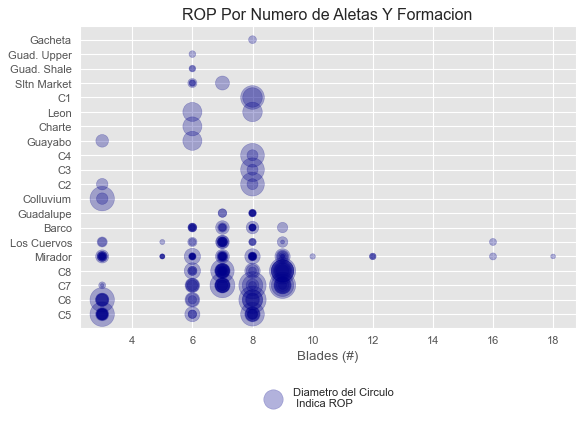

In [87]:
plt.figure(figsize=(8, 5), dpi=80)
plt.scatter(base.Blades,base.Formation,s=10*base["ROP"],c="darkblue",alpha=0.3,label="Diametro del Circulo\n Indica ROP")
plt.title('ROP Por Numero de Aletas Y Formacion')
plt.xlabel("Blades (#)")
plt.legend(loc='lower center', bbox_to_anchor=(0.5, -0.3));

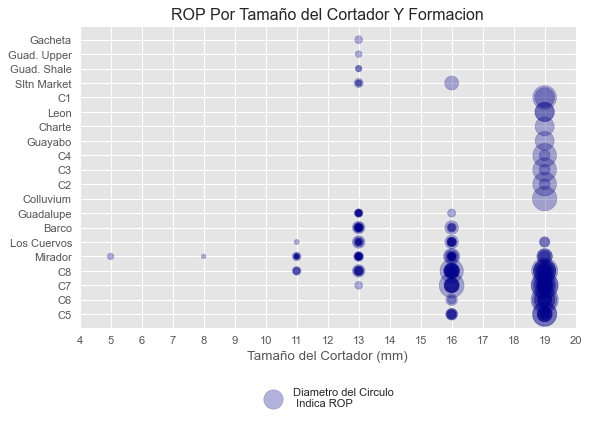

In [88]:
plt.figure(figsize=(8, 5), dpi=80)
plt.scatter(base["Cutter size"],base.Formation,s=10*base["ROP"],c="darkblue",alpha=0.3,label="Diametro del Circulo\n Indica ROP")
plt.title('ROP Por Tamaño del Cortador Y Formacion')
plt.xlabel("Tamaño del Cortador (mm)")
plt.xticks(range(0,21))
plt.xlim([4,20])
plt.legend(loc='lower center', bbox_to_anchor=(0.5, -0.3));

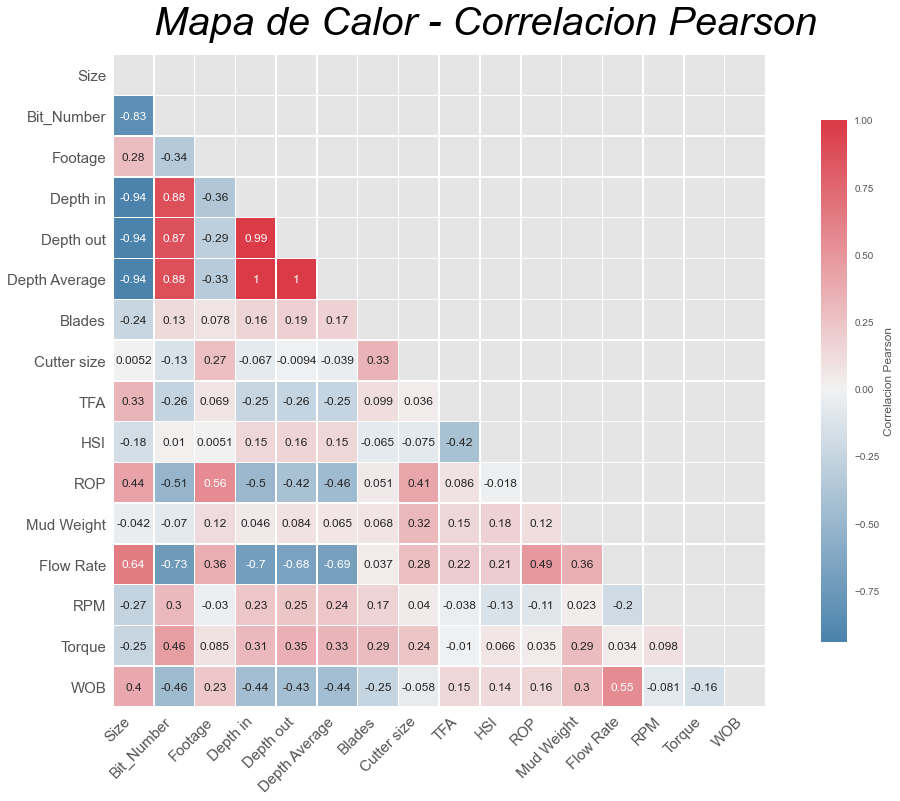

In [89]:
corr = base.corr()
mask = np.triu(np.ones_like(corr, dtype=np.bool))
f, ax = plt.subplots(figsize=(20,12))
cmap = sns.diverging_palette(240, 10, as_cmap=True)
g=sns.heatmap(corr, mask=mask, cmap=cmap, vmax=1, center=0,
            square=True, linewidths=0.5,annot=True,
            cbar_kws={"shrink": 0.8, "label":"Correlacion Pearson"},
            annot_kws={'size':12})
plt.text(1,-0.5, "Mapa de Calor - Correlacion Pearson", fontsize = 40, color='Black', fontstyle='italic')
plt.tick_params(labelsize=15)
g.set_xticklabels(g.get_yticklabels(), rotation=45, horizontalalignment='right');

In [90]:
corr_ROP=pd.DataFrame(corr[(corr["ROP"]>0.1)|(corr["ROP"]<-0.1)]["ROP"])
corr_ROP.sort_values(by="ROP",ascending=True)

,ROP
Bit_Number,-0.508984
Depth in,-0.498664
Depth Average,-0.460120
Depth out,-0.417116
RPM,-0.105793
Mud Weight,0.117936
WOB,0.158319
Cutter size,0.409101
Size,0.437572
Flow Rate,0.489565


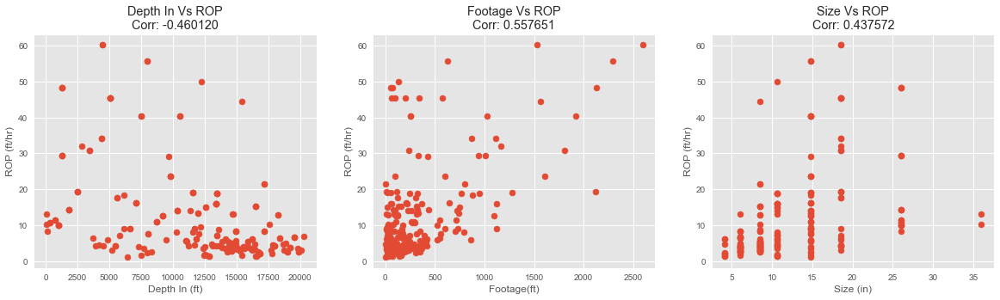

In [91]:
figure(1, figsize=(20, 5))
subplot(131)
scatter(base["Depth Average"],base["ROP"])
title("Depth In Vs ROP\nCorr: %f" %corr_ROP.loc["Depth Average"][0])
ylabel("ROP (ft/hr)")
xlabel("Depth In (ft)")

subplot(132)
scatter(base["Footage"],base["ROP"])
title("Footage Vs ROP\nCorr: %f" %corr_ROP.loc["Footage"][0])
ylabel("ROP (ft/hr)")
xlabel("Footage(ft)")

subplot(133)
scatter(base["Size"],base["ROP"])
title("Size Vs ROP\nCorr: %f" %corr_ROP.loc["Size"][0])
ylabel("ROP (ft/hr)")
xlabel("Size (in)");

Comenzaremos con las pruebas de la libreria *Pycaret*

In [92]:
reg_int = setup(data=base,
            categorical_features=["Size","Re_Run","Type","Structure","Formation","Drive_System","Manufacturer"],
            ignore_features=["Well","Bit_Number","Reference","Depth in","Depth out","HSI"],
            target="ROP",
            normalize=True,
            pca=False,
            pca_method="kernel",
            remove_outliers=True,
            feature_selection=True,
            remove_multicollinearity=False,
            feature_interaction=True,
            feature_ratio=False,
            transform_target=True,
            transform_target_method="box-cox",
            profile=False,
            polynomial_features = False,
            polynomial_degree=3,
            session_id=123
           )

 
Setup Succesfully Completed.


,Description,Value
0,session_id,123
1,Transform Target,True
2,Transform Target Method,box-cox
3,Original Data,"(212, 24)"
4,Missing Values,False
5,Numeric Features,14
6,Categorical Features,9
7,Ordinal Features,False
8,High Cardinality Features,False
9,High Cardinality Method,None


2020-12-01 16:39:20,768 - INFO     - create_model_container: 0
2020-12-01 16:39:20,768 - INFO     - master_model_container: 0
2020-12-01 16:39:20,769 - INFO     - display_container: 0
2020-12-01 16:39:20,770 - INFO     - setup() succesfully completed......................................


In [93]:
top5_int = compare_models(sort="RMSE", round = 4,n_select = 5,
                     whitelist  = ['lr',"lasso","ridge","svm","knn","dt","rf","et","ada","gbr","xgboost","lightgbm"])

,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,TT (Sec)
0,Extra Trees Regressor,3.5066,56.7203,6.8023,0.6086,0.4139,0.3730,0.1142
1,Gradient Boosting Regressor,4.1751,64.2723,7.1632,0.5718,0.4445,0.4404,0.1328
2,Light Gradient Boosting Machine,4.2441,64.3012,7.2267,0.5814,0.4527,0.4550,0.0395
3,Extreme Gradient Boosting,3.9444,65.0576,7.4154,0.4219,0.4700,0.4417,0.0661
4,Random Forest,4.6065,72.9946,7.7007,0.5257,0.4672,0.4625,0.1618
5,AdaBoost Regressor,5.1718,79.5602,8.2847,0.4327,0.4879,0.5134,0.1074
6,K Neighbors Regressor,5.5381,84.7560,8.7366,0.3654,0.5037,0.5268,0.0057
7,Support Vector Machine,5.4508,101.6498,9.3250,0.3423,0.5045,0.4964,0.0086
8,Decision Tree,5.0147,112.0406,9.7002,0.0256,0.6364,0.6842,0.0073
9,Ridge Regression,6.5058,157.2633,11.6037,-0.1528,0.4976,0.4752,0.0074


2020-12-01 16:39:37,572 - INFO     - create_model_container: 5
2020-12-01 16:39:37,573 - INFO     - master_model_container: 5
2020-12-01 16:39:37,573 - INFO     - display_container: 6
2020-12-01 16:39:37,580 - INFO     - [ExtraTreesRegressor(bootstrap=False, ccp_alpha=0.0, criterion='mse',
                    max_depth=None, max_features='auto', max_leaf_nodes=None,
                    max_samples=None, min_impurity_decrease=0.0,
                    min_impurity_split=None, min_samples_leaf=1,
                    min_samples_split=2, min_weight_fraction_leaf=0.0,
                    n_estimators=100, n_jobs=-1, oob_score=False,
                    random_state=123, verbose=0, warm_start=False), GradientBoostingRegressor(alpha=0.9, ccp_alpha=0.0, criterion='friedman_mse',
                          init=None, learning_rate=0.1, loss='ls', max_depth=3,
                          max_features=None, max_leaf_nodes=None,
                          min_impurity_decrease=0.0, min_impurity_split=

In [94]:
# tune top 5 base models
tuned_top5_int = [tune_model(i) for i in top5_int]

,MAE,MSE,RMSE,R2,RMSLE,MAPE
0,4.9838,53.6250,7.3229,0.5764,0.4591,0.3982
1,4.0777,92.5597,9.6208,0.6549,0.3314,0.2092
2,3.0939,18.9326,4.3512,0.4924,0.3502,0.3430
3,8.8129,186.1026,13.6419,0.1152,0.7263,0.5547
4,2.5844,11.3907,3.3750,0.8930,0.2813,0.2901
5,5.4800,111.2007,10.5452,0.6810,0.6071,1.0517
6,4.0114,44.1919,6.6477,0.3529,0.5209,0.5442
7,2.4330,11.3818,3.3737,0.9112,0.3546,0.3998
8,4.2892,105.9132,10.2914,0.1828,0.4644,0.2774
9,2.6773,10.5688,3.2510,0.6590,0.3253,0.3114


2020-12-01 16:40:13,254 - INFO     - create_model_container: 10
2020-12-01 16:40:13,255 - INFO     - master_model_container: 10
2020-12-01 16:40:13,256 - INFO     - display_container: 11
2020-12-01 16:40:13,258 - INFO     - RandomForestRegressor(bootstrap=False, ccp_alpha=0.0, criterion='mae',
                      max_depth=10, max_features='log2', max_leaf_nodes=None,
                      max_samples=None, min_impurity_decrease=0.0,
                      min_impurity_split=None, min_samples_leaf=1,
                      min_samples_split=7, min_weight_fraction_leaf=0.0,
                      n_estimators=170, n_jobs=-1, oob_score=False,
                      random_state=123, verbose=0, warm_start=False)
2020-12-01 16:40:13,258 - INFO     - tune_model() succesfully completed......................................


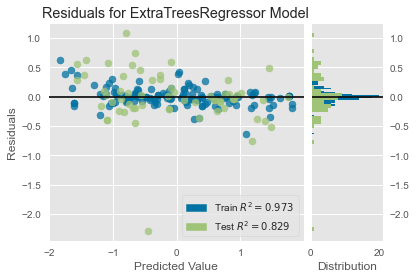

2020-12-01 16:40:13,901 - INFO     - Visual Rendered Successfully
2020-12-01 16:40:13,903 - INFO     - plot_model() succesfully completed......................................


In [95]:
plt.style.use('ggplot')
plot_model(tuned_top5_int[0])

In [96]:
tun_int = tune_model(tuned_top5_int[0])

,MAE,MSE,RMSE,R2,RMSLE,MAPE
0,4.6325,51.1496,7.1519,0.5960,0.4413,0.3889
1,3.8415,83.0488,9.1131,0.6903,0.3405,0.2150
2,2.2625,14.1470,3.7612,0.6207,0.2873,0.2452
3,8.2466,179.6770,13.4044,0.1458,0.7214,0.5551
4,3.0020,19.3608,4.4001,0.8182,0.3531,0.3511
5,4.4901,108.5047,10.4166,0.6887,0.5675,0.9122
6,3.3415,27.7869,5.2713,0.5931,0.3929,0.4445
7,2.7327,16.5657,4.0701,0.8708,0.4154,0.4496
8,3.8011,95.5165,9.7733,0.2630,0.4091,0.1990
9,2.9259,23.2127,4.8180,0.2510,0.3988,0.3583


2020-12-01 16:40:19,453 - INFO     - create_model_container: 11
2020-12-01 16:40:19,454 - INFO     - master_model_container: 11
2020-12-01 16:40:19,454 - INFO     - display_container: 12
2020-12-01 16:40:19,455 - INFO     - ExtraTreesRegressor(bootstrap=False, ccp_alpha=0.0, criterion='mse',
                    max_depth=70, max_features='auto', max_leaf_nodes=None,
                    max_samples=None, min_impurity_decrease=0.0,
                    min_impurity_split=None, min_samples_leaf=2,
                    min_samples_split=7, min_weight_fraction_leaf=0.0,
                    n_estimators=170, n_jobs=-1, oob_score=False,
                    random_state=123, verbose=0, warm_start=False)
2020-12-01 16:40:19,456 - INFO     - tune_model() succesfully completed......................................


In [97]:
evaluate_model(tun_int)

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Hyperparameters', 'param…

2020-12-01 16:40:19,740 - INFO     - Initializing interpret_model()
2020-12-01 16:40:19,745 - INFO     - interpret_model(estimator=ExtraTreesRegressor(bootstrap=False, ccp_alpha=0.0, criterion='mse',
                    max_depth=70, max_features='auto', max_leaf_nodes=None,
                    max_samples=None, min_impurity_decrease=0.0,
                    min_impurity_split=None, min_samples_leaf=2,
                    min_samples_split=7, min_weight_fraction_leaf=0.0,
                    n_estimators=170, n_jobs=-1, oob_score=False,
                    random_state=123, verbose=0, warm_start=False), plot=summary, feature=None, observation=None)
2020-12-01 16:40:19,745 - INFO     - Checking exceptions
2020-12-01 16:40:19,745 - INFO     - Importing libraries
2020-12-01 16:40:19,745 - INFO     - plot type: summary
2020-12-01 16:40:19,745 - INFO     - Creating TreeExplainer
2020-12-01 16:40:19,752 - INFO     - Compiling shap values


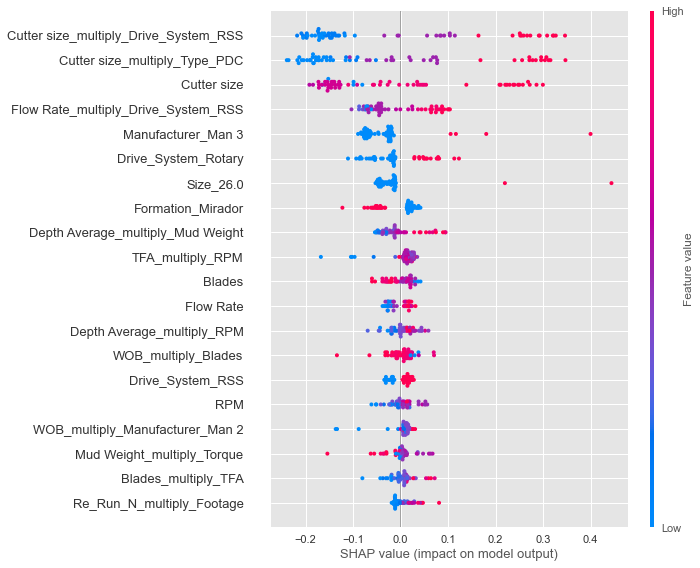

2020-12-01 16:40:20,490 - INFO     - Visual Rendered Successfully
2020-12-01 16:40:20,493 - INFO     - interpret_model() succesfully completed......................................


In [98]:
interpret_model(tun_int)

In [99]:
Mod_Fin_Pred_int=finalize_model(tun_int)

2020-12-01 16:40:20,702 - INFO     - create_model_container: 11
2020-12-01 16:40:20,702 - INFO     - master_model_container: 11
2020-12-01 16:40:20,702 - INFO     - display_container: 12
2020-12-01 16:40:20,702 - INFO     - ExtraTreesRegressor(bootstrap=False, ccp_alpha=0.0, criterion='mse',
                    max_depth=70, max_features='auto', max_leaf_nodes=None,
                    max_samples=None, min_impurity_decrease=0.0,
                    min_impurity_split=None, min_samples_leaf=2,
                    min_samples_split=7, min_weight_fraction_leaf=0.0,
                    n_estimators=170, n_jobs=-1, oob_score=False,
                    random_state=123, verbose=0, warm_start=False)
2020-12-01 16:40:20,706 - INFO     - finalize_model() succesfully completed......................................


In [100]:
Mod_Fin_Pred_int

ExtraTreesRegressor(bootstrap=False, ccp_alpha=0.0, criterion='mse',
                    max_depth=70, max_features='auto', max_leaf_nodes=None,
                    max_samples=None, min_impurity_decrease=0.0,
                    min_impurity_split=None, min_samples_leaf=2,
                    min_samples_split=7, min_weight_fraction_leaf=0.0,
                    n_estimators=170, n_jobs=-1, oob_score=False,
                    random_state=123, verbose=0, warm_start=False)

In [101]:
save_model(Mod_Fin_Pred_int,'Mod_High_Pred_int')

2020-12-01 16:40:20,861 - INFO     - Initializing save_model()
2020-12-01 16:40:20,866 - INFO     - save_model(model=ExtraTreesRegressor(bootstrap=False, ccp_alpha=0.0, criterion='mse',
                    max_depth=70, max_features='auto', max_leaf_nodes=None,
                    max_samples=None, min_impurity_decrease=0.0,
                    min_impurity_split=None, min_samples_leaf=2,
                    min_samples_split=7, min_weight_fraction_leaf=0.0,
                    n_estimators=170, n_jobs=-1, oob_score=False,
                    random_state=123, verbose=0, warm_start=False), model_name=Mod_High_Pred_int, verbose=True)
2020-12-01 16:40:20,866 - INFO     - Appending prep pipeline
2020-12-01 16:40:20,963 - INFO     - Mod_High_Pred_int.pkl saved in current working directory
2020-12-01 16:40:20,971 - INFO     - [Pipeline(memory=None,
         steps=[('dtypes',
                 DataTypes_Auto_infer(categorical_features=['Size', 'Re_Run',
                                       

Transformation Pipeline and Model Succesfully Saved


In [102]:
reg_2 = setup(data=base,
              categorical_features=["Size","Re_Run","Type","Structure","Formation","Drive_System","Manufacturer"],
              ignore_features=["Well","Bit_Number","Reference","Depth in","Depth out","HSI"],
              target="ROP",
              normalize=True,
              pca=False,
              pca_method="kernel",
              remove_outliers=True,
              feature_selection=True,
              remove_multicollinearity=False,
              feature_interaction=False,
              transform_target=True,
              transform_target_method="box-cox",
              profile=False,
              polynomial_features = False,
              polynomial_degree = 3,  
              session_id=123
             )

 
Setup Succesfully Completed.


,Description,Value
0,session_id,123
1,Transform Target,True
2,Transform Target Method,box-cox
3,Original Data,"(212, 24)"
4,Missing Values,False
5,Numeric Features,14
6,Categorical Features,9
7,Ordinal Features,False
8,High Cardinality Features,False
9,High Cardinality Method,None


2020-12-01 16:40:49,218 - INFO     - create_model_container: 0
2020-12-01 16:40:49,219 - INFO     - master_model_container: 0
2020-12-01 16:40:49,220 - INFO     - display_container: 0
2020-12-01 16:40:49,220 - INFO     - setup() succesfully completed......................................


In [103]:
top5_wint = compare_models(sort="R2", round = 4,n_select = 5,
                    whitelist  = ['lr',"lasso","ridge","svm","knn","dt","rf","et","ada","gbr","xgboost","lightgbm"])

,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,TT (Sec)
0,Gradient Boosting Regressor,4.1892,53.6763,6.9114,0.5253,0.4429,0.4417,0.0591
1,Extra Trees Regressor,3.8219,56.5562,7.0447,0.5223,0.4295,0.4097,0.0959
2,Light Gradient Boosting Machine,4.4584,67.1170,7.5602,0.5101,0.4571,0.4430,0.0317
3,Random Forest,4.5542,65.5598,7.6465,0.4942,0.4586,0.4479,0.1390
4,Extreme Gradient Boosting,4.3445,66.8872,7.5818,0.4773,0.4809,0.4737,0.0548
5,Support Vector Machine,5.1236,84.9056,8.6897,0.4060,0.4615,0.4476,0.0067
6,AdaBoost Regressor,5.3535,78.5450,8.4415,0.3916,0.4930,0.5291,0.0721
7,K Neighbors Regressor,5.6758,81.7387,8.6331,0.3659,0.5132,0.5565,0.0048
8,Ridge Regression,5.9745,87.1425,9.2133,0.1580,0.5390,0.5573,0.0058
9,Lasso Regression,7.8929,170.0862,12.2628,-0.1565,0.7698,0.8552,0.0049


2020-12-01 16:41:02,688 - INFO     - create_model_container: 5
2020-12-01 16:41:02,689 - INFO     - master_model_container: 5
2020-12-01 16:41:02,690 - INFO     - display_container: 6
2020-12-01 16:41:02,695 - INFO     - [GradientBoostingRegressor(alpha=0.9, ccp_alpha=0.0, criterion='friedman_mse',
                          init=None, learning_rate=0.1, loss='ls', max_depth=3,
                          max_features=None, max_leaf_nodes=None,
                          min_impurity_decrease=0.0, min_impurity_split=None,
                          min_samples_leaf=1, min_samples_split=2,
                          min_weight_fraction_leaf=0.0, n_estimators=100,
                          n_iter_no_change=None, presort='deprecated',
                          random_state=123, subsample=1.0, tol=0.0001,
                          validation_fraction=0.1, verbose=0, warm_start=False), ExtraTreesRegressor(bootstrap=False, ccp_alpha=0.0, criterion='mse',
                    max_depth=None, max_fea

In [104]:
# tune top 5 base models
tuned_top5_wint = [tune_model(i) for i in top5_wint]

,MAE,MSE,RMSE,R2,RMSLE,MAPE
0,5.9944,86.0090,9.2741,0.3206,0.5353,0.4214
1,3.8121,94.5399,9.7232,0.6475,0.3607,0.1962
2,3.0048,22.1199,4.7032,0.4069,0.3462,0.2872
3,8.1268,157.8499,12.5638,0.2495,0.6393,0.4950
4,2.7390,14.5157,3.8099,0.8637,0.3589,0.3497
5,3.5812,35.0763,5.9225,0.8994,0.5071,0.8934
6,4.2071,49.8202,7.0583,0.2704,0.4244,0.4365
7,3.2072,18.9202,4.3497,0.8524,0.4355,0.4812
8,3.3505,52.8512,7.2699,0.5922,0.3416,0.2701
9,2.5891,12.1785,3.4898,0.6070,0.3666,0.3076


2020-12-01 16:41:27,940 - INFO     - create_model_container: 10
2020-12-01 16:41:27,941 - INFO     - master_model_container: 10
2020-12-01 16:41:27,942 - INFO     - display_container: 11
2020-12-01 16:41:27,947 - INFO     - XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=0.9, gamma=0, gpu_id=-1,
             importance_type='gain', interaction_constraints='',
             learning_rate=0.1, max_delta_step=0, max_depth=110,
             min_child_weight=2, missing=nan, monotone_constraints='()',
             n_estimators=600, n_jobs=-1, num_parallel_tree=1,
             objective='reg:squarederror', random_state=123, reg_alpha=0,
             reg_lambda=1, scale_pos_weight=1, subsample=0.5,
             tree_method='exact', validate_parameters=1, verbosity=0)
2020-12-01 16:41:27,949 - INFO     - tune_model() succesfully completed......................................


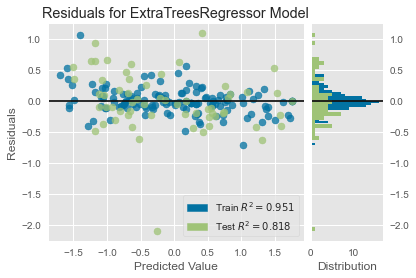

2020-12-01 16:46:55,748 - INFO     - Visual Rendered Successfully
2020-12-01 16:46:55,749 - INFO     - plot_model() succesfully completed......................................


Executing shutdown due to inactivity...
Executing shutdown due to inactivity...


2020-12-01 17:39:01,486 - INFO     - Executing shutdown due to inactivity...


Executing shutdown...
Executing shutdown...


2020-12-01 17:39:05,525 - INFO     - Executing shutdown...


In [127]:
plt.style.use('ggplot')
plot_model(tuned_top5_wint[1])

In [123]:
tun_wint = tune_model(tuned_top5_wint[2])

,MAE,MSE,RMSE,R2,RMSLE,MAPE
0,5.4836,64.8986,8.0560,0.4874,0.5276,0.4596
1,3.8224,109.9601,10.4862,0.5900,0.3573,0.2032
2,1.6831,4.7951,2.1898,0.8714,0.2027,0.1949
3,7.4945,154.8955,12.4457,0.2636,0.6761,0.5127
4,2.7567,17.0385,4.1278,0.8400,0.3465,0.2889
5,5.2543,113.4500,10.6513,0.6745,0.5353,0.8073
6,3.5342,32.7670,5.7242,0.5202,0.4536,0.5146
7,3.0600,16.1261,4.0157,0.8742,0.4171,0.4579
8,3.9892,48.8321,6.9880,0.6232,0.4203,0.3566
9,3.3996,26.1169,5.1105,0.1572,0.3952,0.3526


2020-12-01 16:42:07,088 - INFO     - create_model_container: 12
2020-12-01 16:42:07,089 - INFO     - master_model_container: 12
2020-12-01 16:42:07,090 - INFO     - display_container: 13
2020-12-01 16:42:07,092 - INFO     - LGBMRegressor(boosting_type='gbdt', class_weight=None, colsample_bytree=1.0,
              importance_type='split', learning_rate=0.2, max_depth=30,
              min_child_samples=20, min_child_weight=0.001, min_split_gain=0,
              n_estimators=100, n_jobs=-1, num_leaves=70, objective=None,
              random_state=123, reg_alpha=0.1, reg_lambda=0.5, silent=True,
              subsample=1.0, subsample_for_bin=200000, subsample_freq=0)
2020-12-01 16:42:07,093 - INFO     - tune_model() succesfully completed......................................


In [107]:
evaluate_model(tun_wint)

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Hyperparameters', 'param…

2020-12-01 16:41:33,663 - INFO     - Initializing interpret_model()
2020-12-01 16:41:33,664 - INFO     - interpret_model(estimator=ExtraTreesRegressor(bootstrap=False, ccp_alpha=0.0, criterion='mse',
                    max_depth=70, max_features='auto', max_leaf_nodes=None,
                    max_samples=None, min_impurity_decrease=0.0,
                    min_impurity_split=None, min_samples_leaf=2,
                    min_samples_split=7, min_weight_fraction_leaf=0.0,
                    n_estimators=170, n_jobs=-1, oob_score=False,
                    random_state=123, verbose=0, warm_start=False), plot=summary, feature=None, observation=None)
2020-12-01 16:41:33,665 - INFO     - Checking exceptions
2020-12-01 16:41:33,666 - INFO     - Importing libraries
2020-12-01 16:41:33,667 - INFO     - plot type: summary
2020-12-01 16:41:33,668 - INFO     - Creating TreeExplainer
2020-12-01 16:41:33,680 - INFO     - Compiling shap values


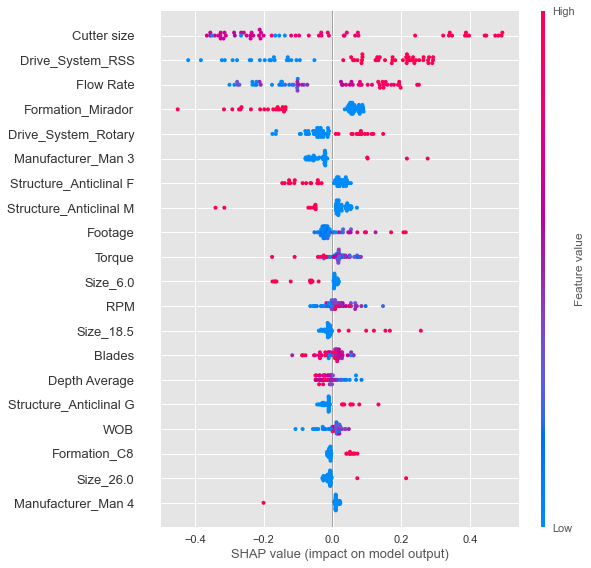

2020-12-01 16:41:34,356 - INFO     - Visual Rendered Successfully
2020-12-01 16:41:34,357 - INFO     - interpret_model() succesfully completed......................................


In [108]:
interpret_model(tun_wint)

In [109]:
Mod_Fin_wint=finalize_model(tun_wint)

2020-12-01 16:41:34,525 - INFO     - create_model_container: 11
2020-12-01 16:41:34,526 - INFO     - master_model_container: 11
2020-12-01 16:41:34,527 - INFO     - display_container: 12
2020-12-01 16:41:34,528 - INFO     - ExtraTreesRegressor(bootstrap=False, ccp_alpha=0.0, criterion='mse',
                    max_depth=70, max_features='auto', max_leaf_nodes=None,
                    max_samples=None, min_impurity_decrease=0.0,
                    min_impurity_split=None, min_samples_leaf=2,
                    min_samples_split=7, min_weight_fraction_leaf=0.0,
                    n_estimators=170, n_jobs=-1, oob_score=False,
                    random_state=123, verbose=0, warm_start=False)
2020-12-01 16:41:34,529 - INFO     - finalize_model() succesfully completed......................................


In [110]:
save_model(Mod_Fin_wint,'Mod_Fin_wint')

2020-12-01 16:41:34,537 - INFO     - Initializing save_model()
2020-12-01 16:41:34,538 - INFO     - save_model(model=ExtraTreesRegressor(bootstrap=False, ccp_alpha=0.0, criterion='mse',
                    max_depth=70, max_features='auto', max_leaf_nodes=None,
                    max_samples=None, min_impurity_decrease=0.0,
                    min_impurity_split=None, min_samples_leaf=2,
                    min_samples_split=7, min_weight_fraction_leaf=0.0,
                    n_estimators=170, n_jobs=-1, oob_score=False,
                    random_state=123, verbose=0, warm_start=False), model_name=Mod_Fin_wint, verbose=True)
2020-12-01 16:41:34,539 - INFO     - Appending prep pipeline
2020-12-01 16:41:34,616 - INFO     - Mod_Fin_wint.pkl saved in current working directory
2020-12-01 16:41:34,623 - INFO     - [Pipeline(memory=None,
         steps=[('dtypes',
                 DataTypes_Auto_infer(categorical_features=['Size', 'Re_Run',
                                                 

Transformation Pipeline and Model Succesfully Saved


In [111]:
Mod_Fin_wint = load_model('Mod_Fin_wint')

Mod_Fin_wint

Transformation Pipeline and Model Sucessfully Loaded


[Pipeline(memory=None,
          steps=[('dtypes',
                  DataTypes_Auto_infer(categorical_features=['Size', 'Re_Run',
                                                             'Type', 'Structure',
                                                             'Formation',
                                                             'Drive_System',
                                                             'Manufacturer'],
                                       display_types=True,
                                       features_todrop=['Well', 'Bit_Number',
                                                        'Reference', 'Depth in',
                                                        'Depth out', 'HSI'],
                                       ml_usecase='regression',
                                       numerical_features=[], target='ROP',
                                       time_features=[])),
                 ('imputer',
                  Simple...
        

In [112]:
Data = pd.DataFrame( {"Size": "8.5",
                    "Type": "PDC",
                    "Structure": "Anticlinal F",
                    "Formation": "Mirador",
                    "Footage": (10500-10000),
                    "Blades" : 8,
                    "Depth Average": (10500+10000)/2,
                    "Cutter size": 13,
                    "Min Flow Rate":500,
                    "Max Flow Rate": 600,
                    "TFA": 1.1,
                    "HSI": 1.1,
                    "Min WOB": 30,
                    "Max WOB": 50,
                    "Mud Weight": 12,
                    "Drive_System": "RSS",
                    "Min_RPM": 60,
                    "Max_RPM": 120,
                    "Torque Max": 35,
                    "Torque Min": 15,
                    "Manufacturer": "Manufacturer 4",
                    "Re_Run" : "N"},
                    index=[0]
                    )

Data["Flow Rate"] = Data[["Min Flow Rate","Max Flow Rate"]].mean(axis=1)
Data["RPM"] = Data[["Min_RPM","Max_RPM"]].mean(axis=1)
Data["Torque"] = Data[["Torque Min","Torque Max"]].mean(axis=1)
Data["WOB"] = Data[["Min WOB","Max WOB"]].mean(axis=1)

Data=Data.drop(["Min Flow Rate","Max Flow Rate","Min_RPM","Max_RPM","Torque Min","Torque Max","Min WOB","Max WOB"],axis=1)

In [113]:
lr_pred_new = predict_model(Mod_Fin_wint, data = Data)

In [114]:
lr_pred_new["Label"][0]

3.5726

In [115]:
# Definicion del Grid

Size=[8.5]
Type=["PDC"]
Structure=["Anticlinal P"]
Formation=["Mirador"]
Footage=[200]
Blades = [11]
Depth_Average=[15000]
Cutter_size=[11]
Flow_Rate= range(300,1220,10)
TFA = [4] 
HSI = [3]
WOB = range(10,75,5)
Mud_Weight=[11]
Drive_System=["RSS"]
RPM = range(20,205,5) 
Torque = range(5,65,5)
Manufacturer=["Man 5"]
Re_Run=["N"]

Data_exp_1=pd.DataFrame(list(product(Size,Type,Structure,Formation,Footage,Blades,Depth_Average,Cutter_size,TFA,HSI,Mud_Weight,Drive_System,Manufacturer,Re_Run,Flow_Rate,RPM,Torque,WOB)),
                 columns=["Size","Type","Structure","Formation","Footage","Blades","Depth Average","Cutter size","TFA","HSI","Mud Weight","Drive_System","Manufacturer","Re_Run","Flow Rate","RPM","Torque","WOB"])

Data_exp_1 # Primeras cinco filas

,Size,Type,Structure,Formation,Footage,Blades,Depth Average,Cutter size,TFA,HSI,Mud Weight,Drive_System,Manufacturer,Re_Run,Flow Rate,RPM,Torque,WOB
0,8.5,PDC,Anticlinal P,Mirador,200,11,15000,11,4,3,11,RSS,Man 5,N,300,20,5,10
1,8.5,PDC,Anticlinal P,Mirador,200,11,15000,11,4,3,11,RSS,Man 5,N,300,20,5,15
2,8.5,PDC,Anticlinal P,Mirador,200,11,15000,11,4,3,11,RSS,Man 5,N,300,20,5,20
3,8.5,PDC,Anticlinal P,Mirador,200,11,15000,11,4,3,11,RSS,Man 5,N,300,20,5,25
4,8.5,PDC,Anticlinal P,Mirador,200,11,15000,11,4,3,11,RSS,Man 5,N,300,20,5,30
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
531019,8.5,PDC,Anticlinal P,Mirador,200,11,15000,11,4,3,11,RSS,Man 5,N,1210,200,60,50
531020,8.5,PDC,Anticlinal P,Mirador,200,11,15000,11,4,3,11,RSS,Man 5,N,1210,200,60,55
531021,8.5,PDC,Anticlinal P,Mirador,200,11,15000,11,4,3,11,RSS,Man 5,N,1210,200,60,60
531022,8.5,PDC,Anticlinal P,Mirador,200,11,15000,11,4,3,11,RSS,Man 5,N,1210,200,60,65


In [116]:
Data_exp_1.shape

(531024, 18)

Categorizaremos los tipos de roca segun su valor de FZI:

|     Parameter     |       Value       |
|:-----------------:|:-----------------:|
|       Size        |       8 1/2       |
|       Type        |        PDC        |
|     Structure     |    Anticlinal P   |
|     Formation     |      Mirador      |
|      Footage      |       200 ft      |
|       Blades      |         11        |
|   Depth_Average   |     15,000 ft     |
|    Cutter Size    |        11 mm      |
|     Flow Rate     |range(300,1220,10) |
|        TFA        |       4 in2       |
|        HSI        |     3 hp/in2      |
|        WOB        |  range(10,75,5)   |
|     Mud Weight    |      11 ppg       |
|    Drive System   |        RSS        |
|        RPM        |  range(20,205,5)  |
|      Torque       |   range(5,65,5)   |
|   Manufacturer    |       Man 3       |
|       Re Run      |         N         |

In [117]:
lr_pred_new = predict_model(Mod_Fin_wint, data = Data_exp_1)

In [118]:
lr_pred_new.Label.max()

3.7431

In [119]:
def malla(lr_pred_new,var_1,val_1,var_2,val_2):
    
    var = ["WOB", "RPM", "Torque","Flow Rate"]
    
    var.remove(var_1)
    var.remove(var_2)
    
    tab_plot=lr_pred_new.loc[(lr_pred_new[var_1] == val_1)&(lr_pred_new[var_2] == val_2)]
    Tabla_1=tab_plot.pivot(index=var[0],columns=var[1],values="Label")
    
    fig, ax = plt.subplots(figsize=(15,7))
    
    ax=sns.heatmap(Tabla_1,xticklabels=5,yticklabels=3,cmap="seismic", ax=ax,cbar=True,
                   vmin=lr_pred_new.Label.min(),vmax=lr_pred_new.Label.max(),
                   cbar_kws={"shrink": 1, "label":" ROP (ft/hr)","orientation": "vertical"},
                   annot_kws={'size':10}
           )

    title = "Curva de Nivel ROP"
    subtitle = "Parametros Fijos\n"+var_1 + "= "+str(val_1) + " & "+var_2 + "= "+str(val_2)
    plt.title(title,fontsize=25,x=0.5,y=1.1)    
    plt.suptitle(subtitle,fontsize=15,x=0.44,y=0.95)
    ax.tick_params(labelsize=15)

    ax.invert_yaxis()
    
    x = Tabla_1.columns.values
    y = Tabla_1.index.values
    z = Tabla_1.values

    fig = go.Figure(data=[go.Surface(z=z, x=x, y=y,colorscale="RdBu_r",
                                     cmin=lr_pred_new.Label.min(),cmax=lr_pred_new.Label.max())])
    
    fig.update_layout(scene = dict(
                        xaxis_title=var[1],
                        yaxis_title=var[0],
                        zaxis_title='ROP'),
                      title={'text': "ROP (ft/ht)",'y':0.9,'x':0.5,'xanchor': 'center','yanchor': 'top'},
                      width=800, height=600,
                      margin=dict(l=65, r=50, b=65, t=90)
                     )
    fig.show()
        
    return

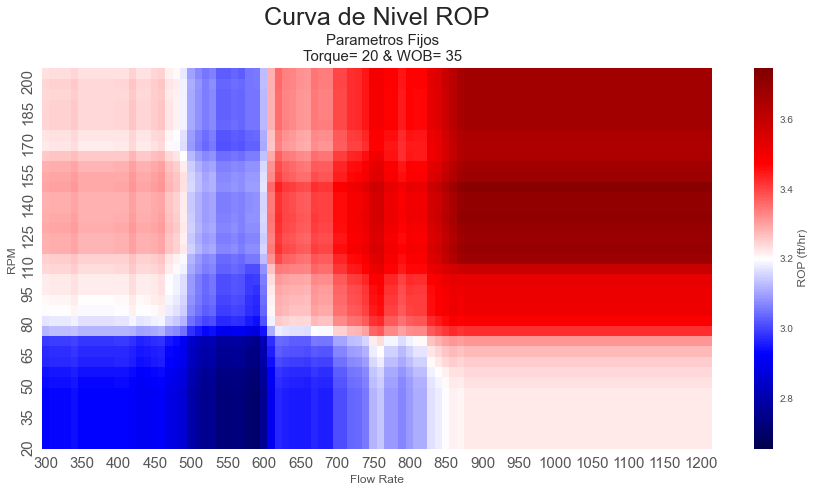

In [120]:
malla(lr_pred_new,"Torque",20,"WOB",35)